In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import scanpy.external as sce
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import glob as glob
import scikit_posthocs as sp
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [2]:
from statsmodels.stats import multitest

In [3]:
sc.set_figure_params(dpi=300, dpi_save=300, color_map = 'viridis')
sc.settings.verbosity = 3

In [38]:
cd4 = sc.read_h5ad("../../chromVAR/Lifespan_CD4T_chromVAR.h5ad")
cd8 = sc.read_h5ad("../../chromVAR/Lifespan_CD8T_chromVAR.h5ad")


In [5]:
cd4summary = pd.read_csv("NaiveCD4_chromVAR.csv")
cd8summary = pd.read_csv("NaiveCD8_chromVAR.csv")

In [6]:
def plotVolcano(sigdeviations, g1, g2, g1g2comparisonp, title, tfs, pvalthresh=0.05, fcthresh=0.02, figsize=(5,5), color_values=['#0000FF','#FF0000']):
    
    with rc_context({'figure.figsize': figsize, 
                 'axes.grid': False, 
                 'xtick.labelsize': 10, 
                 'legend.loc':'center left',
                }):
        
        nrow=1
        ncol=1
        fig, curaxs = plt.subplots(nrows=nrow, ncols=ncol, figsize=figsize)
        
        
        selection = sigdeviations.copy()
        
        g2vals = (selection[g2])
        g1vals = (selection[g1])
        
        x = g2vals-g1vals
        y = -np.log10(selection[g1g2comparisonp])
        
        colors = np.zeros(len(y), dtype=object)
        colors[:] = "#CCCCCC"
        colors[(selection[g1g2comparisonp] < pvalthresh)] = '#000000'
        colors[(selection[g1g2comparisonp] < pvalthresh) & (x >= fcthresh)] = color_values[0]
        colors[(selection[g1g2comparisonp] < pvalthresh) & (x <= -fcthresh)] = color_values[1]

        plt.scatter(x,y, c=colors)
        plt.axhline(-np.log10(pvalthresh), linestyle='--', lw=0.5, c='#cccccc')
        plt.axvline(-fcthresh, linestyle='--', lw=0.5, c='#cccccc')
        plt.axvline(fcthresh, linestyle='--', lw=0.5, c='#cccccc')
        x_lim = np.max(np.abs(x))*1.1
        plt.xlim([-x_lim,x_lim])
        
        customlabels = selection[(selection[g1g2comparisonp] < pvalthresh) & (np.abs(x) >= fcthresh)]
        for cur in range(len(customlabels)):
            currow = customlabels.iloc[cur,:]
            cury = -np.log10(currow[g1g2comparisonp])
            curx = currow[g2]-currow[g1]
            if currow['TF'] in tfs:
                curaxs.annotate(currow['TF'], xy=(curx,cury), xytext=(curx,cury),fontsize=5)

        plt.xlim((-0.04, 0.04))
        plt.xlabel('Mean Difference')
        plt.ylabel('-log10 Adjusted P-Value')
        plt.title(title)

        plt.tight_layout()

        return fig

# Fig. 8d

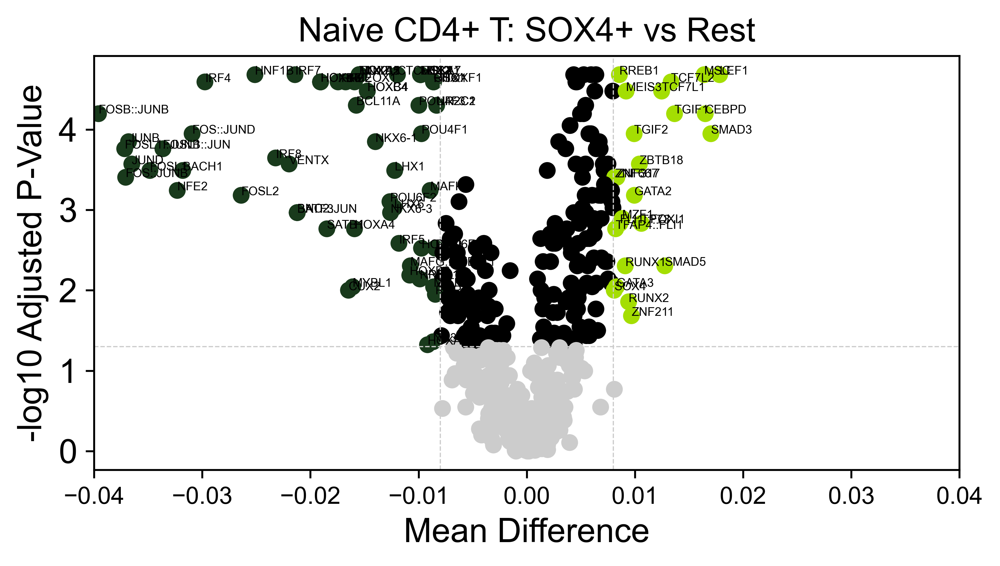

In [7]:


fig = plotVolcano(cd4summary,  'Avg. CD4_naive_SOX4-', 'Avg. CD4_naive_SOX4+', 'padjust', 'Naive CD4+ T: SOX4+ vs Rest', cd4summary['TF'].unique(),  figsize=(6,3.5), color_values=['#a4de02','#193A1C'], 
                 fcthresh=0.008,)
fig
fig.savefig("./figures/NCD4_ChromVAR_Volcano.pdf")

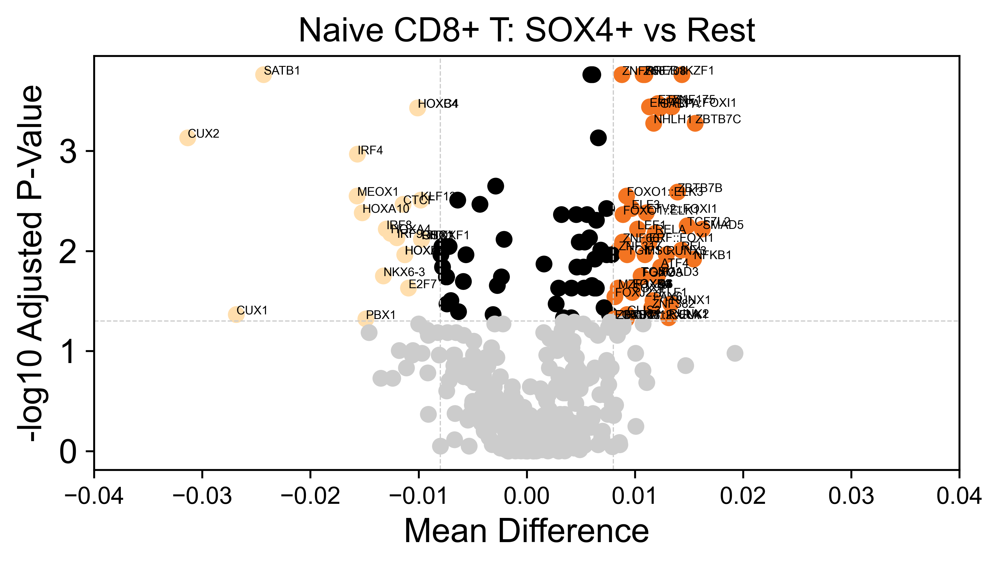

In [9]:


fig = plotVolcano(cd8summary,  'Avg. CD8_naive_SOX4-', 'Avg. CD8_naive_SOX4+', 'padjust', 'Naive CD8+ T: SOX4+ vs Rest', cd8summary['TF'].unique(),  figsize=(6,3.5), color_values=['#F37421','#ffdead'], 
                 fcthresh=0.008,)

fig.savefig("NCD8_ChromVAR_Volcano_all.pdf")

# Fig. 8e & Extended Data Fig. 10g

In [143]:
def getMedianDeviationsPairedGroup(obj, tf, a1, a2, annotationvar='Annotation'):
    rv1 = []
    rv2 = []
    rv3 = []

    
    for cursample in np.unique(obj.obs['batch']):
        med_a1 = np.median(obj.obs[tf][(obj.obs['batch'] == cursample) & (obj.obs[annotationvar] == a1)])
        med_a2 = np.median(obj.obs[tf][(obj.obs['batch'] == cursample) & (obj.obs[annotationvar] == a2)])
        if not np.isnan(med_a1) and not np.isnan(med_a2):
            rv3.append(cursample)
            rv1.append(med_a1)
            rv2.append(med_a2)
            
    return rv1, rv2, rv3

In [150]:
import seaborn as sb
import scipy.stats as stats
from statsmodels.stats import multitest
def plotPairedBoxplot(adata, g1, g2, tf, palette=['#2FBBAB', '#C49CC8'], figsize=(3,5),  lw=0.25, ptsize=5, vmax=None, vmin=None,):
    
    pairedlist = getMedianDeviationsPairedGroup(adata, tf, g1, g2, )

    pval = stats.wilcoxon(pairedlist[0], pairedlist[1])[1]
    
    ## Code for Plotting
    fig, ax = plt.subplots(figsize=figsize)
    
    stripplotdf = dict()
    stripplotdf['SampleID'] = []

    stripplotdf['Group'] = []
    stripplotdf['chromVAR Deviation Score'] = []

    for curi in range(len(pairedlist[0])):
        stripplotdf['SampleID'].append(pairedlist[2][curi])
        stripplotdf['Group'].append(g1)
        stripplotdf['chromVAR Deviation Score'].append(pairedlist[0][curi])
        stripplotdf['SampleID'].append(pairedlist[2][curi])
        stripplotdf['Group'].append(g2)
        stripplotdf['chromVAR Deviation Score'].append(pairedlist[1][curi])


    stripplotdf = pd.DataFrame(stripplotdf)
    
    sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)

    swarmax = sb.stripplot(stripplotdf, x='Group', y='chromVAR Deviation Score', color='#000000', edgecolor='#000000', linewidth=0.25, size=ptsize, legend=None)

    coords_df_0 = pd.DataFrame(swarmax.collections[0].get_offsets(), columns=['x', 'y'])
    coords_df_1 = pd.DataFrame(swarmax.collections[1].get_offsets(), columns=['x', 'y'])

    for curi in range(len(coords_df_0)):
        plt.plot([coords_df_0.loc[curi,'x'],coords_df_1.loc[curi,'x']], [coords_df_0.loc[curi,'y'],coords_df_1.loc[curi,'y']], marker=None, linestyle='-', color='#000000', alpha=0.25)

            
    plt.ylabel("Avg. chromVAR Deviation Score")
    if vmin or vmax:
        plt.ylim((vmin,vmax))

    plt.grid(False)
    plt.xticks(rotation=45)

    plt.title(tf)
    print(pval)
    
               
    return fig, stripplotdf.pivot_table(index='SampleID',columns=['Group'])
    

1.9073486328125e-06


/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD4_naive_SOX4+ CD4_naive_SOX4-
SampleID                                         
Ado_1                   -0.005018       -0.009263
Ado_2                   -0.008354       -0.009561
Ado_3                   -0.005008       -0.007459
Infant_1                 0.031143        0.019913
Infant_2                 0.007455       -0.014066
Infant_3                 0.008669       -0.018712
Infant_4                 0.010800       -0.010876
Infant_5                 0.014988        0.015900
Infant_6                -0.004735       -0.017017
Infant_7                -0.004211       -0.020561
Infant_8                 0.015953        0.001370
Infant_9                 0.013064       -0.000004
Older_2                 -0.004771       -0.017738
Older_3                 -0.003992       -0.026990
Older_5                 -0.008540       -0.016924
Young_1                  0.034476        0.008135
Young_2                  0.014663        0.008259
Young_3                  0.008283       -0.009010
Young_4                  0.005117       -0.011328
Young_5                 -0.004605       -0.018499
Young_6                 -0.005883       -0.016260

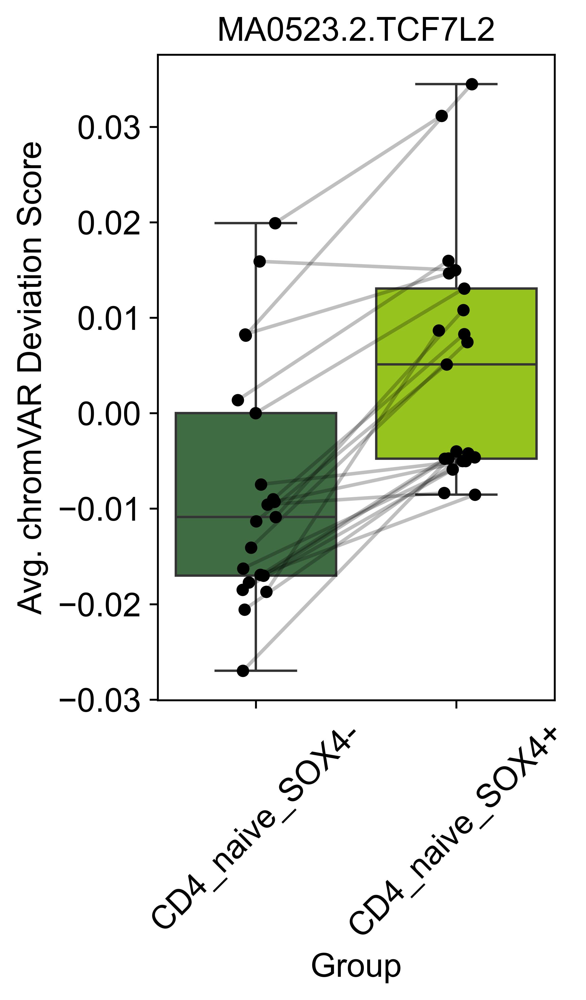

In [151]:
fig, df = plotPairedBoxplot(cd4,  'CD4_naive_SOX4-', "CD4_naive_SOX4+", 'MA0523.2.TCF7L2', palette=['#39733e','#a4de02',], figsize=(3,5))
fig.savefig('./figures/NCD4_TCF7L2.pdf')

df

0.00040793418884277344


/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD8_naive_SOX4+ CD8_naive_SOX4-
SampleID                                         
Ado_1                    0.004196       -0.013496
Ado_2                    0.000505       -0.014271
Ado_3                    0.012915       -0.006442
Infant_1                 0.027700        0.008020
Infant_2                -0.009936       -0.016203
Infant_3                 0.011520       -0.033643
Infant_4                 0.011579       -0.011011
Infant_5                 0.015169       -0.019832
Infant_6                -0.003362       -0.016844
Infant_7                -0.017438       -0.025492
Infant_8                 0.008861       -0.018991
Infant_9                 0.008163       -0.004412
Older_1                 -0.061049       -0.024560
Older_2                 -0.031373       -0.022811
Older_3                  0.004085       -0.018837
Older_4                  0.002484       -0.008727
Older_5                 -0.001095       -0.021632
Young_1                  0.039203        0.016724
Young_2                  0.009358        0.014466
Young_3                 -0.000139       -0.014344
Young_4                  0.026861       -0.006998
Young_5                 -0.009020       -0.012695
Young_6                  0.004213       -0.015670

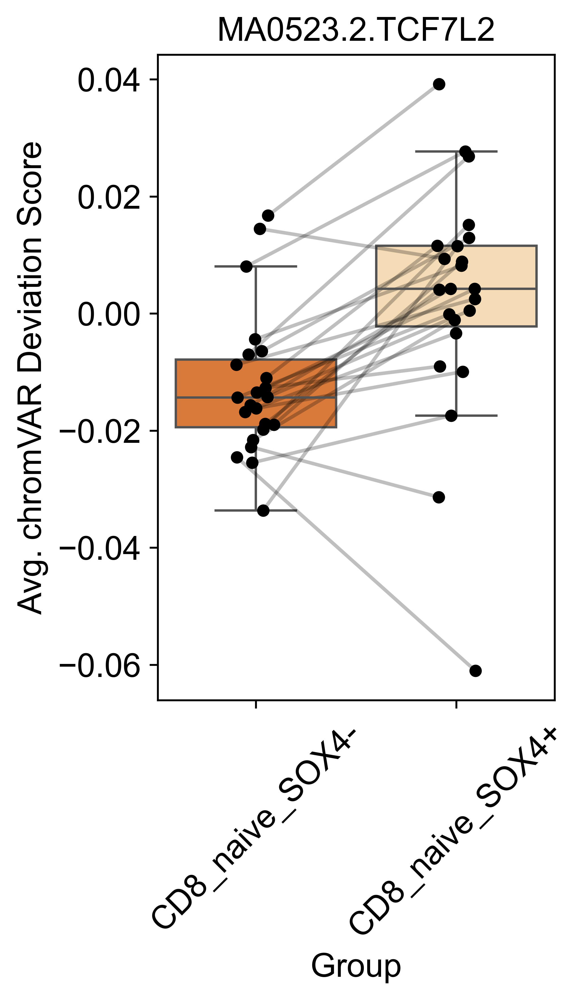

In [156]:
fig, df = plotPairedBoxplot(cd8,  'CD8_naive_SOX4-', "CD8_naive_SOX4+", 'MA0523.2.TCF7L2', palette=['#F37421','#ffdead',], figsize=(3,5))
fig.savefig('./figures/NCD8_TCF7L2.pdf')

df

/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


1.33514404296875e-05


chromVAR Deviation Score                
Group             CD4_naive_SOX4+ CD4_naive_SOX4-
SampleID                                         
Ado_1                   -0.030997       -0.025884
Ado_2                   -0.002464       -0.017019
Ado_3                   -0.022345       -0.032052
Infant_1                 0.042243        0.002549
Infant_2                 0.024774        0.002849
Infant_3                 0.032523        0.007954
Infant_4                 0.027502       -0.006178
Infant_5                 0.028894        0.011686
Infant_6                -0.012961       -0.014152
Infant_7                -0.033556       -0.040240
Infant_8                 0.012898       -0.006322
Infant_9                -0.027687       -0.032941
Older_2                 -0.021901       -0.016201
Older_3                 -0.003102       -0.021428
Older_5                 -0.009911       -0.021695
Young_1                  0.009110       -0.013145
Young_2                  0.006285       -0.019541
Young_3                  0.014802       -0.009404
Young_4                 -0.003655       -0.026889
Young_5                  0.006650       -0.028377
Young_6                 -0.018415       -0.032324

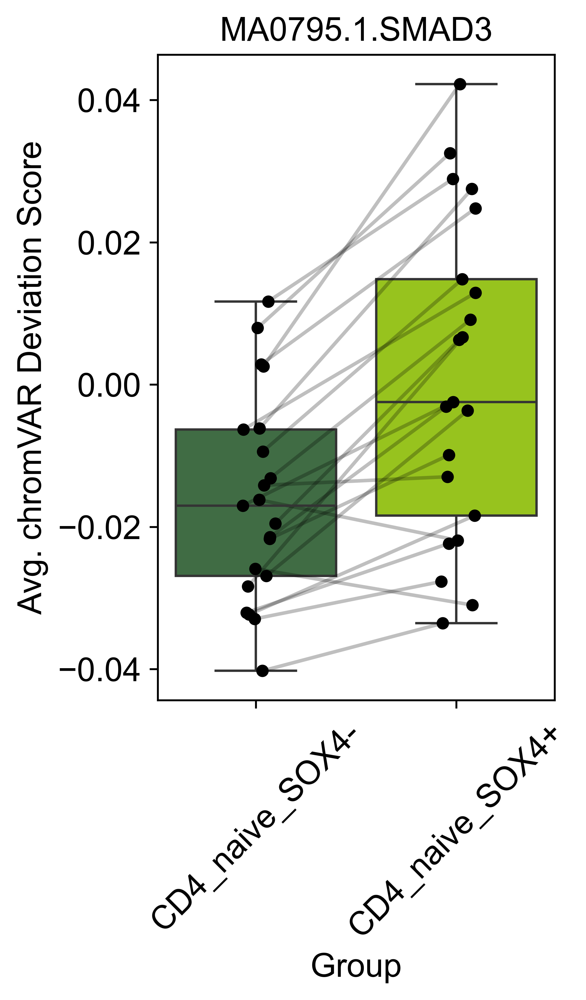

In [153]:
fig, df = plotPairedBoxplot(cd4,  'CD4_naive_SOX4-', "CD4_naive_SOX4+", 'MA0795.1.SMAD3', palette=['#39733e','#a4de02',], figsize=(3,5))
fig.savefig('./figures/NCD4_SMAD3.pdf')

df


0.002726316452026367


/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD8_naive_SOX4+ CD8_naive_SOX4-
SampleID                                         
Ado_1                   -0.008381       -0.018838
Ado_2                    0.004641       -0.008153
Ado_3                   -0.006375       -0.019403
Infant_1                 0.018938        0.002077
Infant_2                 0.021568       -0.012374
Infant_3                 0.024275        0.037757
Infant_4                 0.028627       -0.003803
Infant_5                 0.024958       -0.029278
Infant_6                -0.006301        0.005608
Infant_7                -0.016041       -0.023184
Infant_8                 0.008331       -0.011305
Infant_9                -0.003574       -0.020347
Older_1                 -0.049691       -0.069738
Older_2                 -0.015511       -0.011853
Older_3                 -0.008501       -0.026536
Older_4                 -0.065942       -0.003235
Older_5                  0.007275       -0.012118
Young_1                 -0.005788       -0.014108
Young_2                 -0.003277       -0.028560
Young_3                 -0.020286       -0.028262
Young_4                  0.003116       -0.007441
Young_5                 -0.002625       -0.014499
Young_6                  0.004427       -0.026486

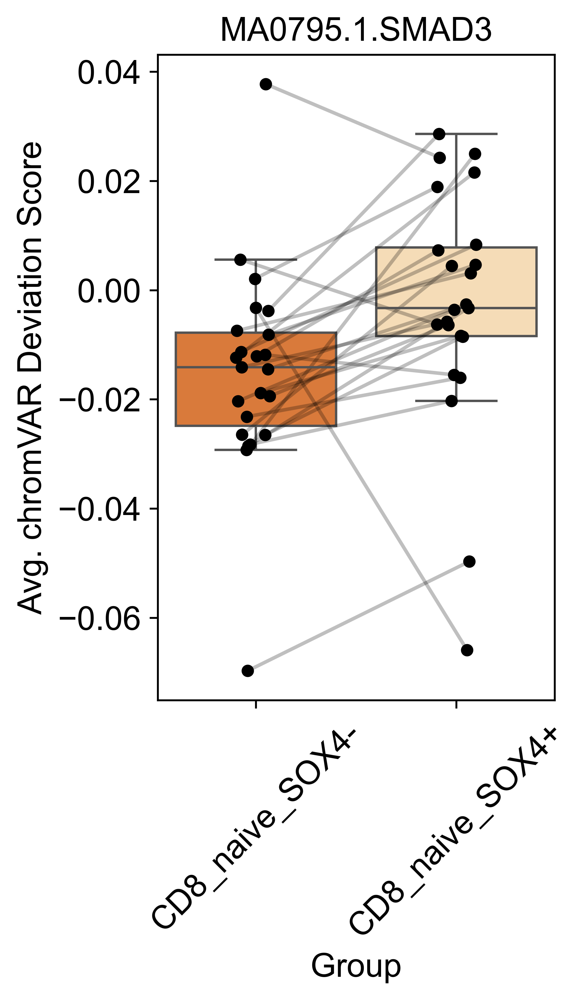

In [157]:
fig, df = plotPairedBoxplot(cd8,  'CD8_naive_SOX4-', "CD8_naive_SOX4+", 'MA0795.1.SMAD3', palette=['#F37421','#ffdead',], figsize=(3,5))
fig.savefig('./figures/NCD8_SMAD3.pdf')
df

0.0032787322998046875


/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD4_naive_SOX4+ CD4_naive_SOX4-
SampleID                                         
Ado_1                    0.002497        0.000042
Ado_2                    0.003738       -0.006766
Ado_3                   -0.001397       -0.005081
Infant_1                 0.030398        0.014550
Infant_2                -0.000046       -0.013772
Infant_3                 0.004516       -0.001888
Infant_4                 0.004676       -0.023801
Infant_5                 0.008321       -0.004751
Infant_6                -0.008195       -0.014906
Infant_7                -0.003254       -0.015611
Infant_8                 0.012038       -0.003462
Infant_9                 0.002826       -0.006285
Older_2                 -0.007231       -0.006653
Older_3                 -0.022215       -0.007151
Older_5                  0.002294       -0.008758
Young_1                  0.016693        0.008690
Young_2                 -0.006488        0.000432
Young_3                  0.018666       -0.007160
Young_4                 -0.007841       -0.010308
Young_5                  0.012749       -0.007907
Young_6                 -0.015785       -0.006410

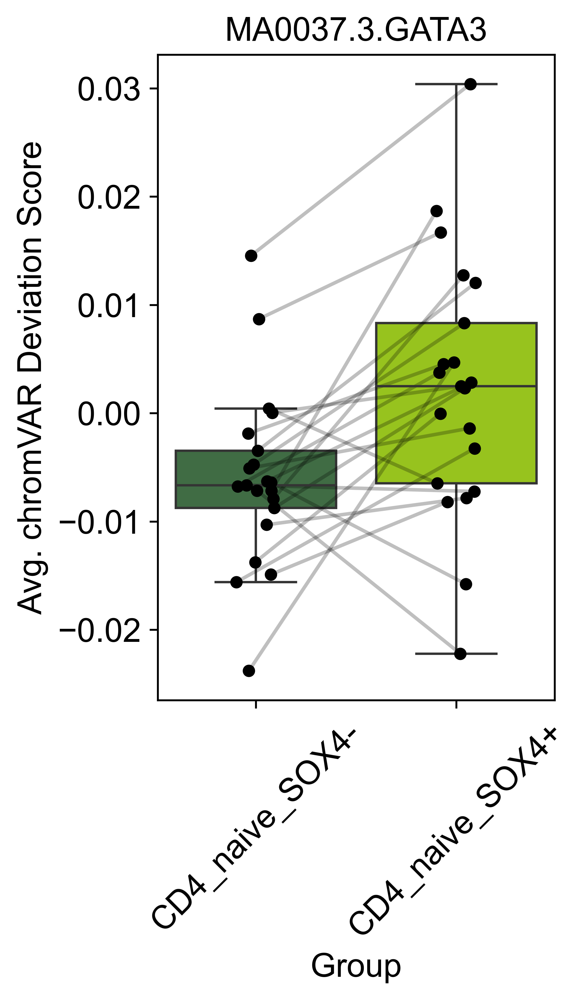

In [155]:


fig, df = plotPairedBoxplot(cd4,  'CD4_naive_SOX4-', "CD4_naive_SOX4+", 'MA0037.3.GATA3', palette=['#39733e','#a4de02',], figsize=(3,5))
fig.savefig('./figures/NCD4_GATA3.pdf')

df

0.03838014602661133


/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD8_naive_SOX4+ CD8_naive_SOX4-
SampleID                                         
Ado_1                   -0.005535       -0.003967
Ado_2                   -0.005596        0.002440
Ado_3                   -0.001051        0.000940
Infant_1                 0.012674        0.007834
Infant_2                -0.010364        0.000993
Infant_3                -0.004133       -0.024599
Infant_4                -0.009996       -0.010790
Infant_5                -0.006086       -0.010794
Infant_6                -0.012911       -0.021376
Infant_7                -0.009528       -0.009091
Infant_8                -0.004533        0.003453
Infant_9                -0.004582        0.000968
Older_1                  0.016645        0.019812
Older_2                 -0.023052        0.001251
Older_3                  0.002254        0.002855
Older_4                 -0.021223        0.014474
Older_5                 -0.014632        0.000833
Young_1                  0.027382        0.015494
Young_2                  0.022676        0.027748
Young_3                 -0.007306        0.012625
Young_4                 -0.036899        0.009378
Young_5                  0.002671        0.016248
Young_6                  0.004038        0.007538

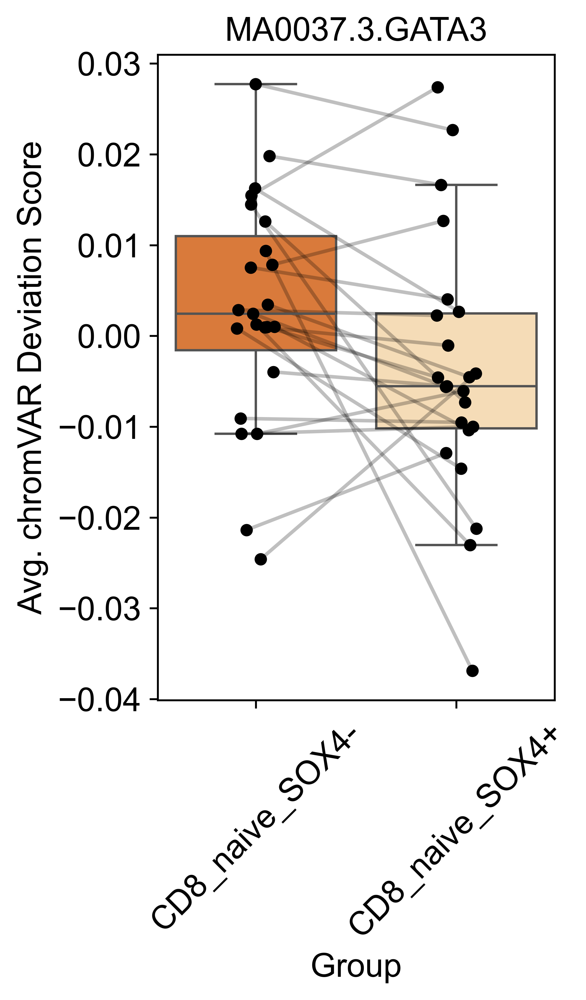

In [158]:


fig, df = plotPairedBoxplot(cd8,  'CD8_naive_SOX4-', "CD8_naive_SOX4+", 'MA0037.3.GATA3', palette=['#F37421','#ffdead',], figsize=(3,5))
fig.savefig('./figures/NCD8_GATA3.pdf')

df


0.7334699630737305


/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athib/Library/Python/3.13/lib/python/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD4_naive_SOX4+ CD4_naive_SOX4-
SampleID                                         
Ado_1                    0.002360        0.008040
Ado_2                    0.002469        0.006651
Ado_3                    0.002985        0.009918
Infant_1                -0.004944       -0.007899
Infant_2                -0.001796       -0.003079
Infant_3                 0.000548       -0.010159
Infant_4                 0.000476       -0.003421
Infant_5                -0.002557       -0.002318
Infant_6                -0.008454       -0.006347
Infant_7                -0.010075       -0.013494
Infant_8                -0.003411       -0.002950
Infant_9                 0.001533        0.002475
Older_2                 -0.013510        0.001194
Older_3                  0.000672       -0.004564
Older_5                 -0.007921        0.007672
Young_1                 -0.005692        0.008925
Young_2                  0.006062        0.008954
Young_3                  0.009106        0.005786
Young_4                 -0.017851        0.008312
Young_5                  0.045742        0.006007
Young_6                  0.017921        0.001512

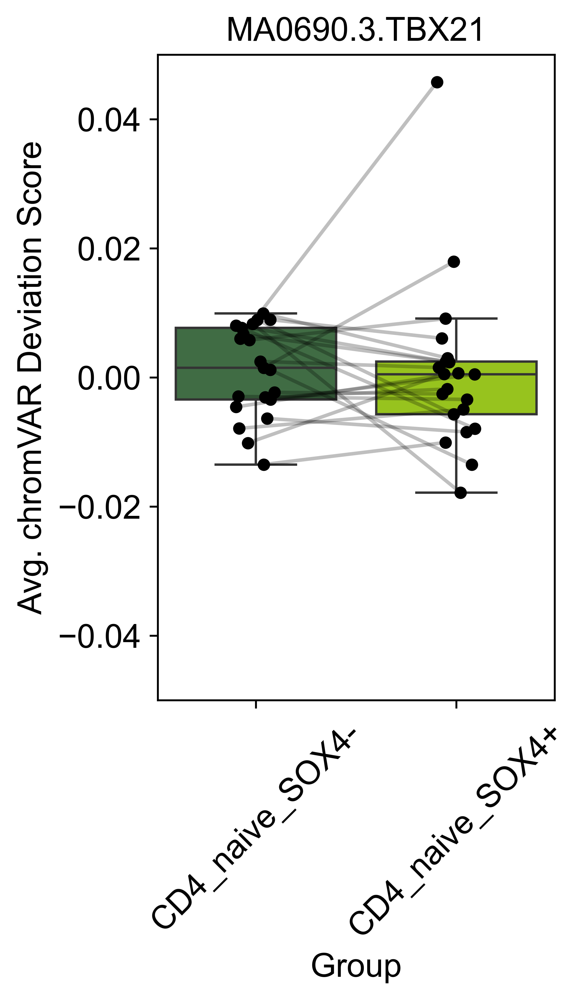

In [159]:
fig , df = plotPairedBoxplot(cd4,  'CD4_naive_SOX4-', "CD4_naive_SOX4+", 'MA0690.3.TBX21', palette=['#39733e','#a4de02',], vmin=-0.05, vmax=0.05,  figsize=(3,5))
fig.savefig('./figures/NCD4_TBX21.pdf')

df

0.39307284355163574


/var/folders/6z/4f2kjdcd2pj9cxfbcgy_73vmvwjr__/T/ipykernel_26186/89302630.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.boxplot(stripplotdf, x='Group',y='chromVAR Deviation Score', showfliers = False, palette=palette, linewidth=1)


chromVAR Deviation Score                
Group             CD8_naive_SOX4+ CD8_naive_SOX4-
SampleID                                         
Ado_1                   -0.017721       -0.005897
Ado_2                    0.002366        0.004334
Ado_3                    0.005807        0.003072
Infant_1                -0.000131       -0.003221
Infant_2                 0.004237       -0.010287
Infant_3                 0.002496       -0.012115
Infant_4                 0.012294        0.027361
Infant_5                 0.004142        0.008136
Infant_6                -0.012881       -0.003876
Infant_7                -0.017487       -0.016972
Infant_8                 0.000620        0.006508
Infant_9                -0.006291        0.002250
Older_1                  0.012212       -0.003099
Older_2                 -0.034159       -0.011610
Older_3                 -0.012366       -0.012869
Older_4                  0.023964        0.006188
Older_5                 -0.000545       -0.003108
Young_1                 -0.007173       -0.001851
Young_2                  0.001640        0.000056
Young_3                 -0.015271       -0.004942
Young_4                  0.005021       -0.001663
Young_5                 -0.028411       -0.005939
Young_6                 -0.010957       -0.003934

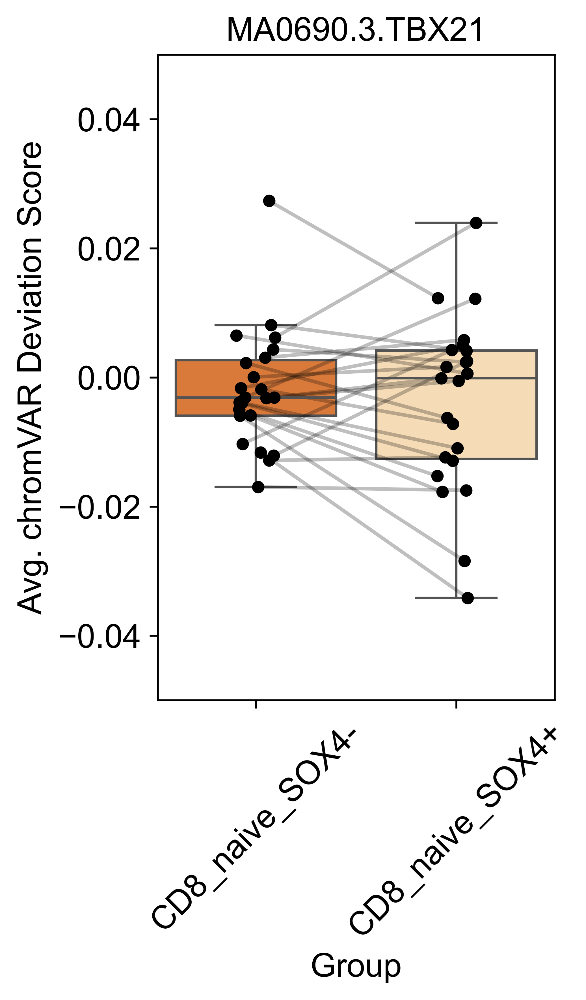

In [160]:
fig , df = plotPairedBoxplot(cd8,  'CD8_naive_SOX4-', "CD8_naive_SOX4+", 'MA0690.3.TBX21', palette=['#F37421','#ffdead',], vmin=-0.05, vmax=0.05, figsize=(3,5))
fig.savefig('./figures/NCD8_TBX21.pdf')

df

# Figure 8 f and g, Extended Data Fig. 10h

In [37]:
agepalette = dict()
agepalette['Infant'] = "#0072B2"
agepalette['Child'] = "#56B4E9"
agepalette['Adolescent'] = "#009E73"
agepalette['Young Adult'] = "#F0E442"
agepalette['Middle Age'] = "#E69F00"
agepalette['Older Adult'] = "#D55E00"

In [170]:
def getMedianDeviationsByAge(obj, tf, annotation, samplevar='batch', agevar='Age', annotationvar='Annotation'):
    rv = dict()
    rv['MedianDeviation'] = []
    rv['Age'] = []

    index = []
    for cursample in np.unique(obj.obs['batch']):
        curage = obj.obs.loc[(obj.obs[samplevar] == cursample), agevar].values[0]
        curdeviation = np.median(obj.obs.loc[(obj.obs['batch'] == cursample) & (obj.obs[annotationvar].isin(annotation)), tf])
        if not np.isnan(curdeviation):
            index.append(cursample)
            rv['MedianDeviation'].append(curdeviation)
            rv['Age'].append(curage)
    
    return pd.DataFrame(rv, index=index)

In [171]:
def plotCorrelation(adata, tf, celltype, annotatations, figsize=(3.5,3.5), ylabel='MedianDeviation'):
    with rc_context({'figure.figsize': figsize, 
                 'axes.grid': False, 
                 'xtick.labelsize': 10, 
                 'legend.loc':'center left',
                }):
        curdf = getMedianDeviationsByAge(adata, tf, annotatations, samplevar='batch', agevar='Age', annotationvar='Annotation')

        curdf['Group'] = None

        curdf.loc[curdf['Age'] < 85, 'Group'] = "Older Adult"
        curdf.loc[curdf['Age'] < 65, 'Group'] = "Middle Age"
        curdf.loc[curdf['Age'] < 40, 'Group'] = "Young Adult"
        curdf.loc[curdf['Age'] < 18, 'Group'] = "Adolescent"
        curdf.loc[curdf['Age'] < 12, 'Group'] = "Child"
        curdf.loc[curdf['Age'] < 2, 'Group'] = "Infant"

        fig = plt.figure()
        plt.grid(False)
        sb.regplot(curdf, x='Age', y=ylabel, scatter=False, color='#000000')
        sb.scatterplot(curdf, x='Age', y=ylabel, hue = 'Group', palette=agepalette)
        plt.title(celltype+" - "+tf)

        print("Pearson: "+str(stats.pearsonr(curdf[ylabel], curdf['Age'])))
        print("Spearman: "+str(stats.spearmanr(curdf[ylabel], curdf['Age'])))

        plt.xticks([0,25,50,75],[0,25,50,75])
        return fig, curdf

Pearson: PearsonRResult(statistic=np.float64(-0.6207905810208765), pvalue=np.float64(0.0015728820369062362))
Spearman: SignificanceResult(statistic=np.float64(-0.7106498857918437), pvalue=np.float64(0.00014459966078498936))


,MedianDeviation,Age,Group
Ado_1,-0.006120,12.380000,Adolescent
Ado_2,-0.002543,15.980000,Adolescent
Ado_3,-0.011123,16.160000,Adolescent
Infant_1,0.007908,0.164167,Infant
Infant_2,0.004077,0.197500,Infant
Infant_3,0.003479,0.235833,Infant
Infant_4,0.009197,0.247500,Infant
Infant_5,0.007521,0.269167,Infant
Infant_6,-0.004366,0.525000,Infant
Infant_7,-0.004909,0.550000,Infant


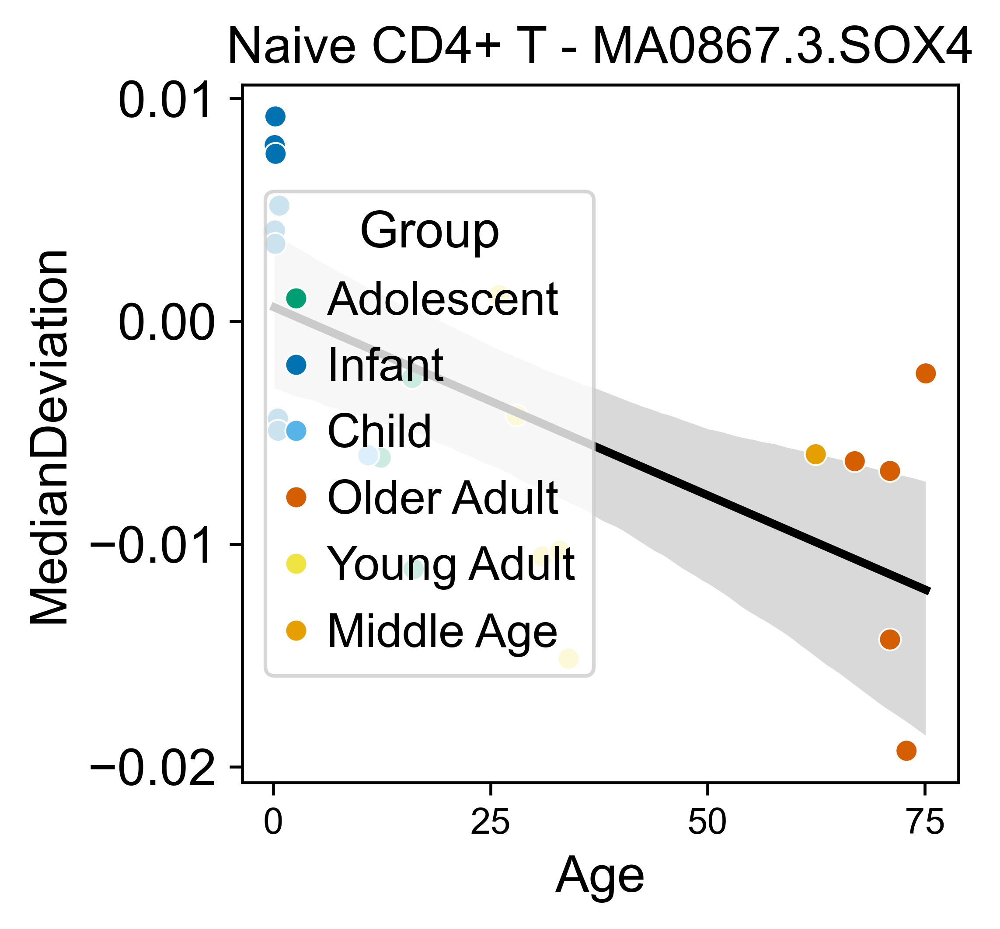

In [172]:
fig, curdf = plotCorrelation(cd4, 'MA0867.3.SOX4', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_SOX4Correlations.pdf")

curdf

Pearson: PearsonRResult(statistic=np.float64(-0.4973439180235674), pvalue=np.float64(0.015752530074634504))
Spearman: SignificanceResult(statistic=np.float64(-0.34593527124776824), pvalue=np.float64(0.10589902000629434))


,MedianDeviation,Age,Group
Ado_1,-0.001560,12.380000,Adolescent
Ado_2,-0.003935,15.980000,Adolescent
Ado_3,-0.004927,16.160000,Adolescent
Infant_1,0.011703,0.164167,Infant
Infant_2,-0.004945,0.197500,Infant
Infant_3,-0.008053,0.235833,Infant
Infant_4,-0.000387,0.247500,Infant
Infant_5,0.001735,0.269167,Infant
Infant_6,-0.001966,0.525000,Infant
Infant_7,-0.000438,0.550000,Infant


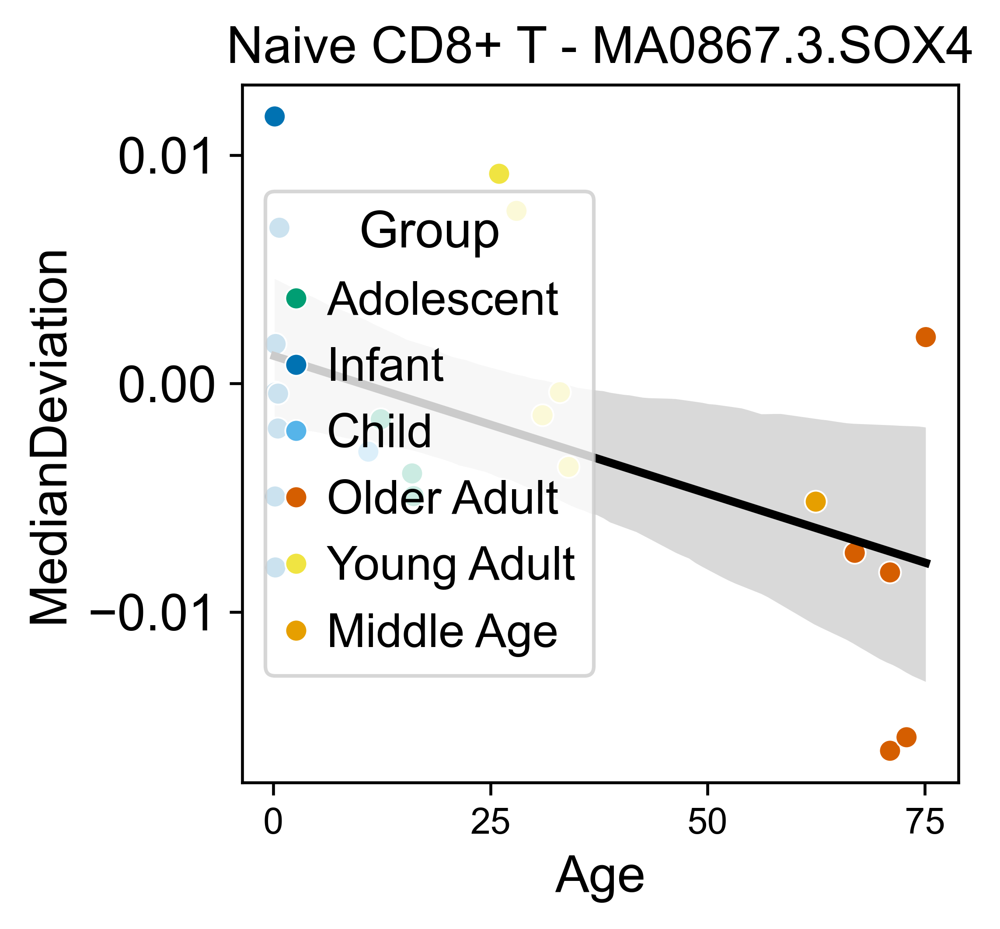

In [173]:
fig , curdf = plotCorrelation(cd8, 'MA0867.3.SOX4', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_SOX4Correlations.pdf")

curdf

Pearson: PearsonRResult(statistic=np.float64(-0.7641567335874795), pvalue=np.float64(2.1930642209586354e-05))
Spearman: SignificanceResult(statistic=np.float64(-0.7467259926505396), pvalue=np.float64(4.261957981486711e-05))


,MedianDeviation,Age,Group
Ado_1,-0.005222,12.380000,Adolescent
Ado_2,-0.004331,15.980000,Adolescent
Ado_3,-0.002134,16.160000,Adolescent
Infant_1,0.017953,0.164167,Infant
Infant_2,0.005237,0.197500,Infant
Infant_3,0.005823,0.235833,Infant
Infant_4,0.008261,0.247500,Infant
Infant_5,0.013654,0.269167,Infant
Infant_6,-0.010087,0.525000,Infant
Infant_7,-0.016194,0.550000,Infant


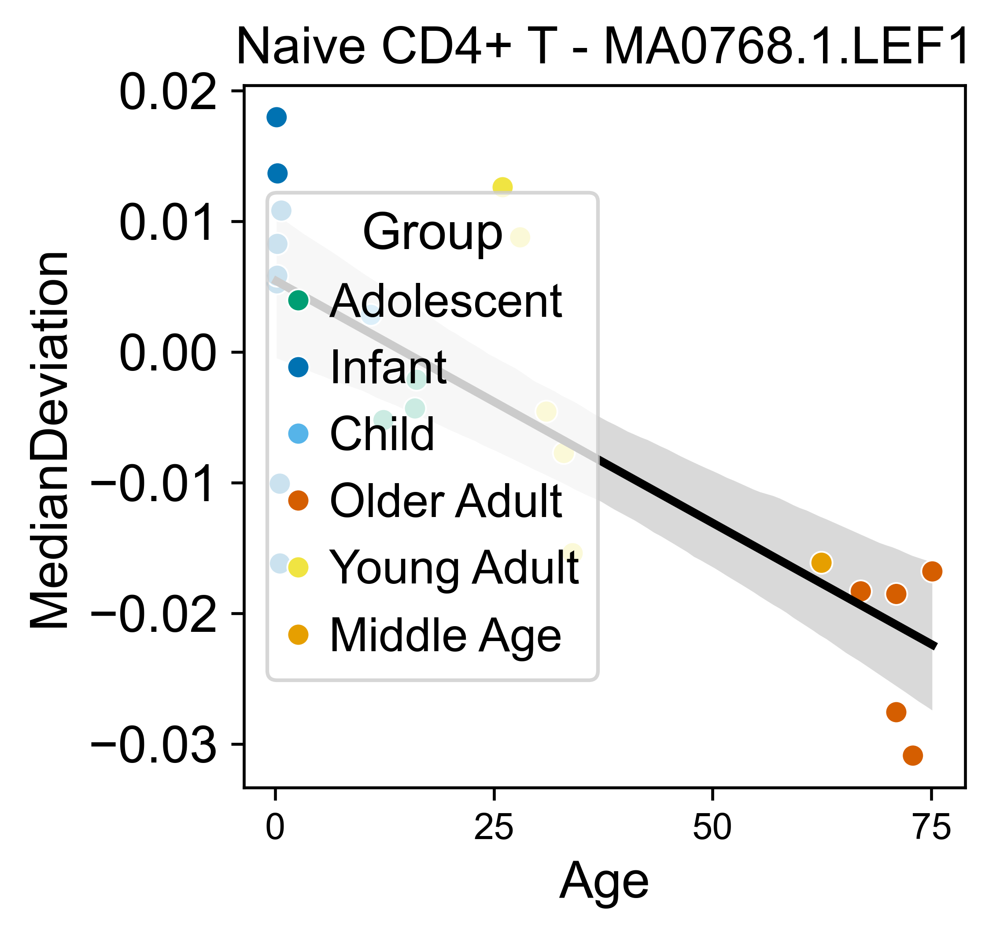

In [174]:
fig, df = plotCorrelation(cd4, 'MA0768.1.LEF1', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_LEF1Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.49042175247955255), pvalue=np.float64(0.017508889520979617))
Spearman: SignificanceResult(statistic=np.float64(-0.4813442202790375), pvalue=np.float64(0.020049567203759253))


,MedianDeviation,Age,Group
Ado_1,-0.003688,12.380000,Adolescent
Ado_2,-0.008917,15.980000,Adolescent
Ado_3,-0.004333,16.160000,Adolescent
Infant_1,0.017888,0.164167,Infant
Infant_2,-0.012821,0.197500,Infant
Infant_3,0.001303,0.235833,Infant
Infant_4,0.005363,0.247500,Infant
Infant_5,0.008770,0.269167,Infant
Infant_6,-0.007486,0.525000,Infant
Infant_7,-0.020955,0.550000,Infant


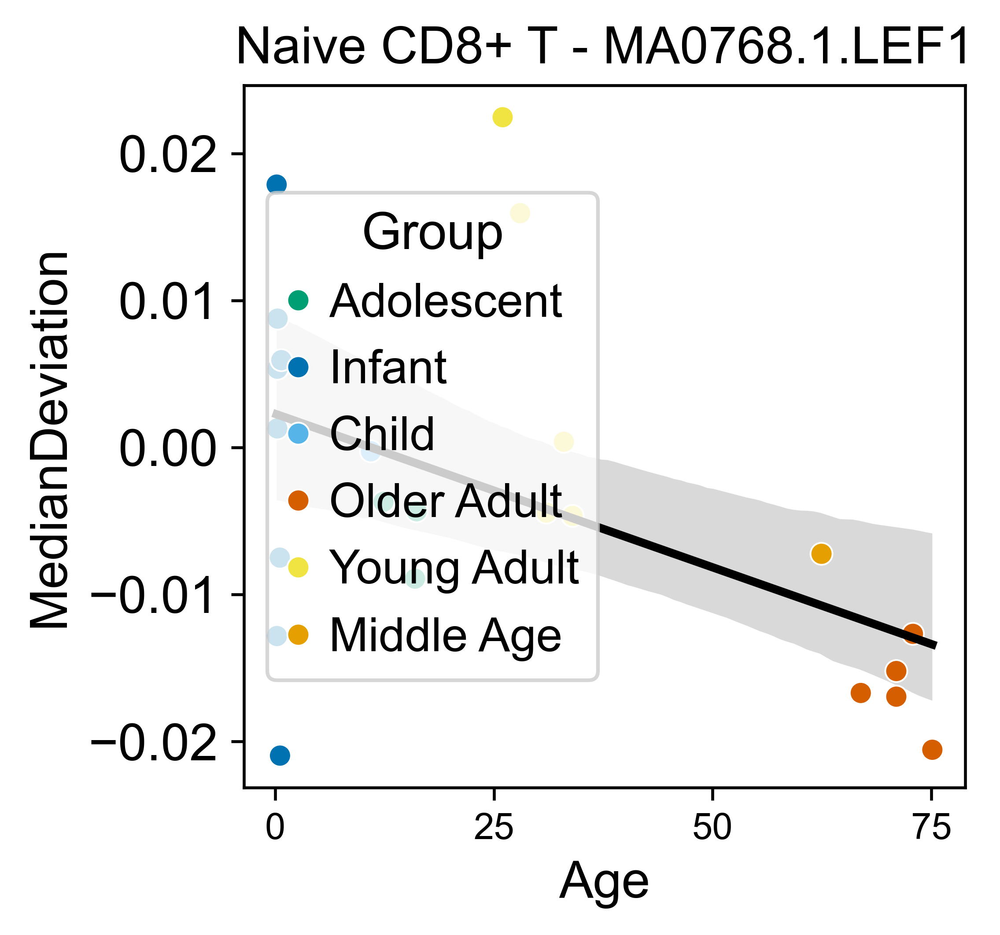

In [175]:
fig, df = plotCorrelation(cd8, 'MA0768.1.LEF1', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_LEF1Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.8682318107046553), pvalue=np.float64(7.926498136948425e-08))
Spearman: SignificanceResult(statistic=np.float64(-0.841611095621356), pvalue=np.float64(4.839007935684836e-07))


,MedianDeviation,Age,Group
Ado_1,0.007304,12.380000,Adolescent
Ado_2,0.001677,15.980000,Adolescent
Ado_3,-0.001896,16.160000,Adolescent
Infant_1,0.009254,0.164167,Infant
Infant_2,0.007918,0.197500,Infant
Infant_3,0.004398,0.235833,Infant
Infant_4,0.005170,0.247500,Infant
Infant_5,0.019934,0.269167,Infant
Infant_6,-0.008006,0.525000,Infant
Infant_7,-0.004603,0.550000,Infant


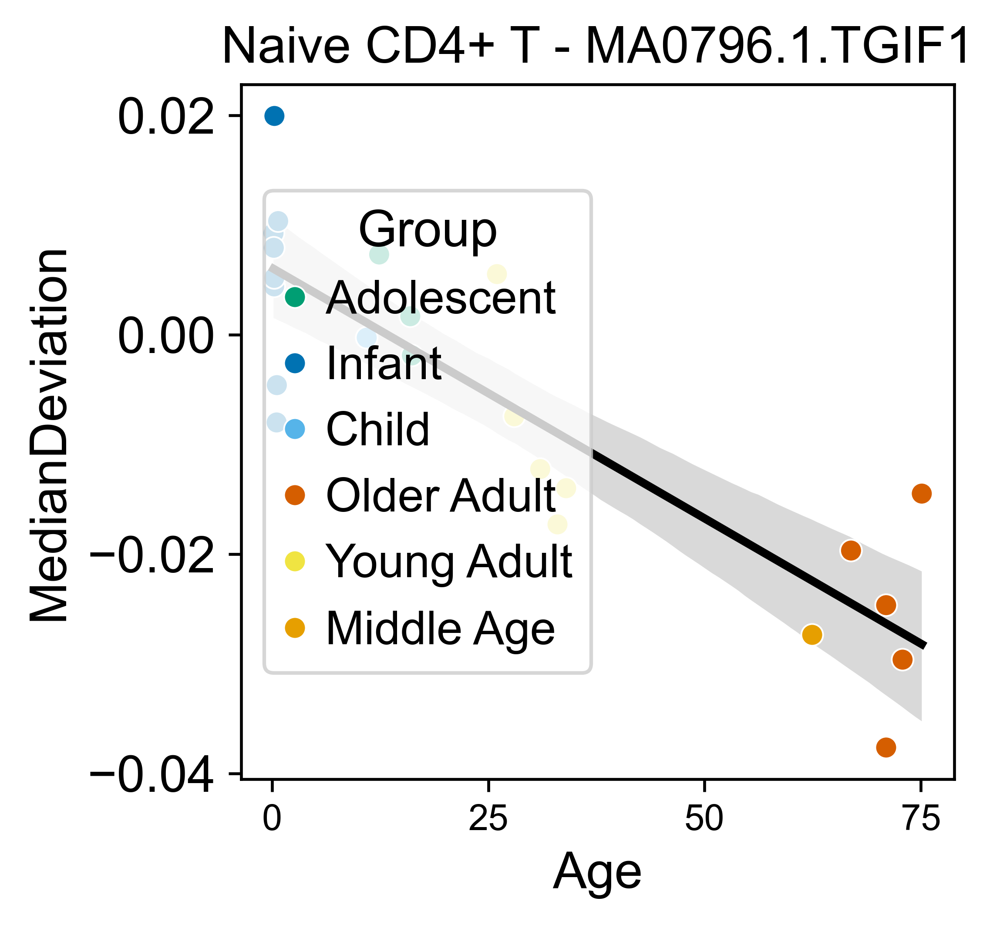

In [176]:
fig, df = plotCorrelation(cd4, 'MA0796.1.TGIF1', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_TGIF1Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.7693228357240506), pvalue=np.float64(1.7817365423617315e-05))
Spearman: SignificanceResult(statistic=np.float64(-0.7328885818006288), pvalue=np.float64(6.964905360825704e-05))


,MedianDeviation,Age,Group
Ado_1,0.003726,12.380000,Adolescent
Ado_2,0.002795,15.980000,Adolescent
Ado_3,0.005852,16.160000,Adolescent
Infant_1,0.013864,0.164167,Infant
Infant_2,0.002622,0.197500,Infant
Infant_3,-0.000106,0.235833,Infant
Infant_4,0.001844,0.247500,Infant
Infant_5,0.015224,0.269167,Infant
Infant_6,-0.007173,0.525000,Infant
Infant_7,-0.011373,0.550000,Infant


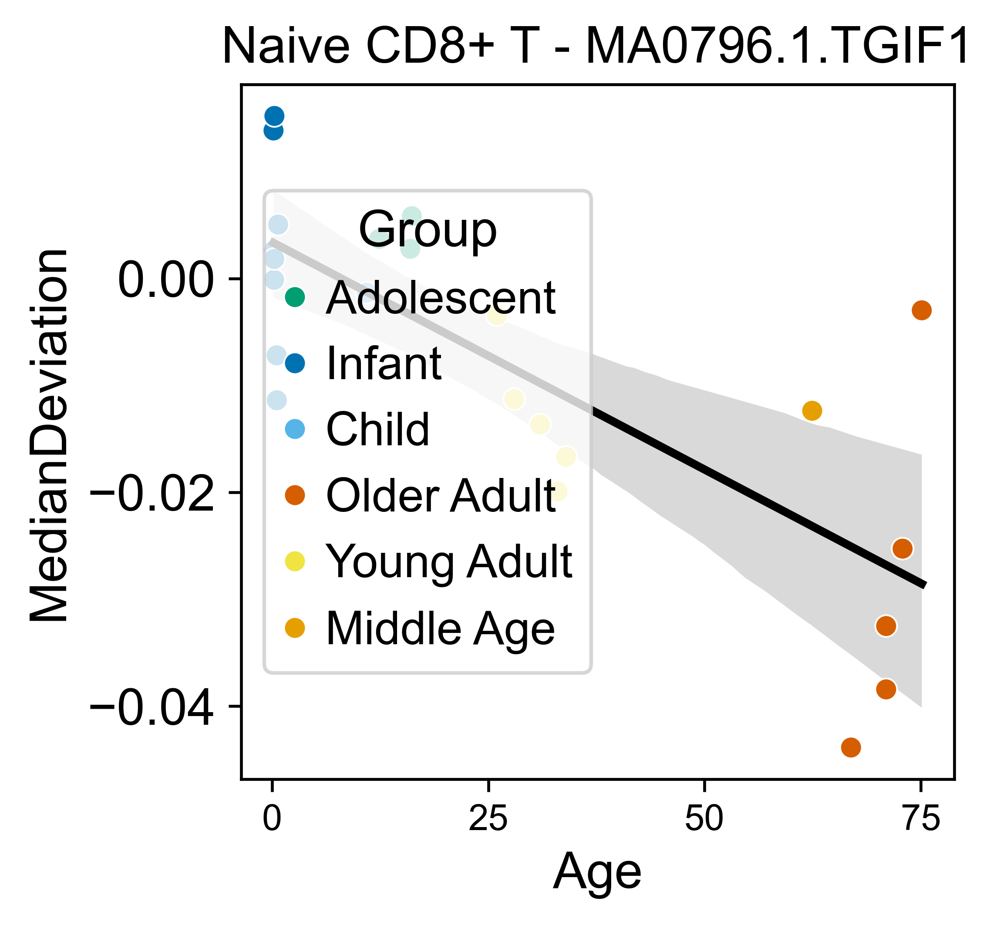

In [177]:
fig, df = plotCorrelation(cd8, 'MA0796.1.TGIF1', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_TGIF1Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.5011289180099778), pvalue=np.float64(0.014854574179075281))
Spearman: SignificanceResult(statistic=np.float64(-0.58215964218553), pvalue=np.float64(0.0035634599725338535))


,MedianDeviation,Age,Group
Ado_1,0.000605,12.380000,Adolescent
Ado_2,-0.005505,15.980000,Adolescent
Ado_3,-0.003438,16.160000,Adolescent
Infant_1,0.018156,0.164167,Infant
Infant_2,-0.001938,0.197500,Infant
Infant_3,0.004238,0.235833,Infant
Infant_4,0.002946,0.247500,Infant
Infant_5,0.007813,0.269167,Infant
Infant_6,-0.010246,0.525000,Infant
Infant_7,-0.012910,0.550000,Infant


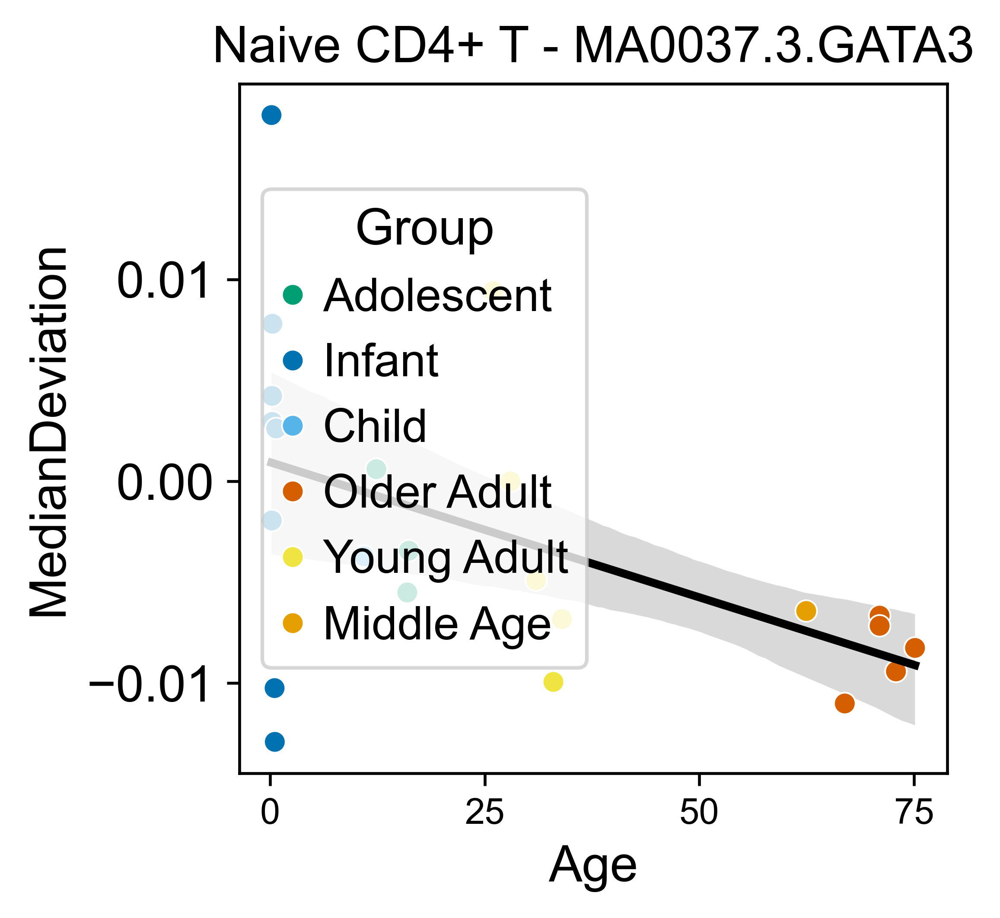

In [178]:
fig, df = plotCorrelation(cd4, 'MA0037.3.GATA3', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_GATA3Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(0.47808839943398024), pvalue=np.float64(0.021030272895593928))
Spearman: SignificanceResult(statistic=np.float64(0.5816654489408902), pvalue=np.float64(0.0035986201069089815))


,MedianDeviation,Age,Group
Ado_1,-0.004523,12.380000,Adolescent
Ado_2,0.001704,15.980000,Adolescent
Ado_3,0.000922,16.160000,Adolescent
Infant_1,0.010893,0.164167,Infant
Infant_2,-0.010185,0.197500,Infant
Infant_3,-0.004305,0.235833,Infant
Infant_4,-0.009996,0.247500,Infant
Infant_5,-0.006505,0.269167,Infant
Infant_6,-0.013844,0.525000,Infant
Infant_7,-0.009309,0.550000,Infant


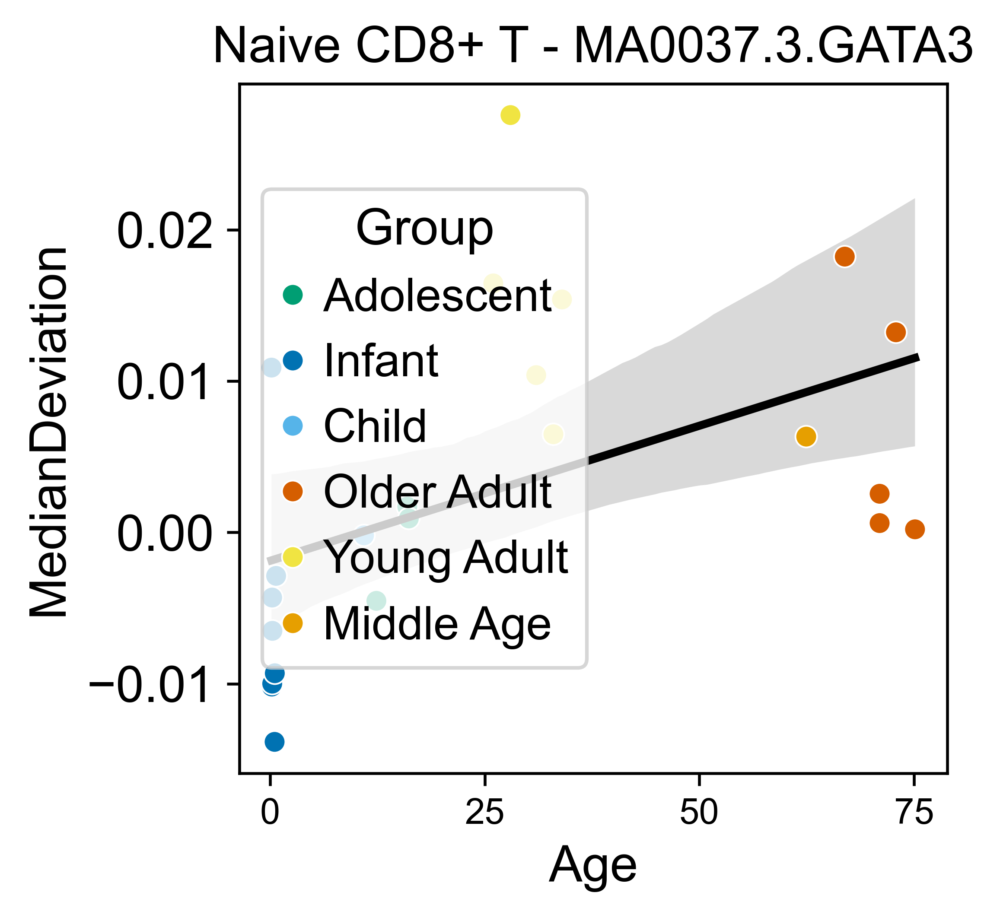

In [183]:
fig, df = plotCorrelation(cd8, 'MA0037.3.GATA3', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_GATA3Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.7219801822373112), pvalue=np.float64(0.00010051670580774539))
Spearman: SignificanceResult(statistic=np.float64(-0.755127277809414), pvalue=np.float64(3.114997948226335e-05))


,MedianDeviation,Age,Group
Ado_1,-0.008216,12.380000,Adolescent
Ado_2,-0.009316,15.980000,Adolescent
Ado_3,-0.006314,16.160000,Adolescent
Infant_1,0.022051,0.164167,Infant
Infant_2,0.005455,0.197500,Infant
Infant_3,0.006844,0.235833,Infant
Infant_4,0.009389,0.247500,Infant
Infant_5,0.015217,0.269167,Infant
Infant_6,-0.009030,0.525000,Infant
Infant_7,-0.016875,0.550000,Infant


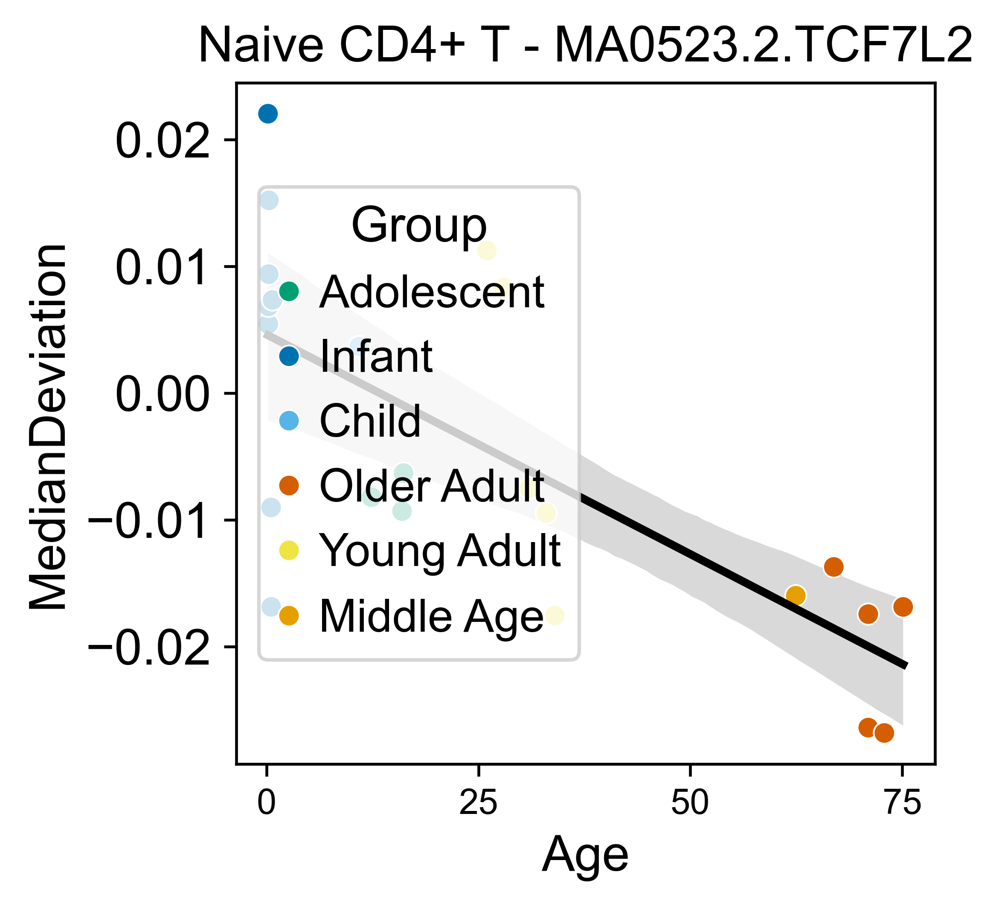

In [179]:
fig, df = plotCorrelation(cd4, 'MA0523.2.TCF7L2', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_TCF7L2Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.6131384468818297), pvalue=np.float64(0.0018648910913737786))
Spearman: SignificanceResult(statistic=np.float64(-0.6212009085120638), pvalue=np.float64(0.0015583923287336313))


,MedianDeviation,Age,Group
Ado_1,-0.008531,12.380000,Adolescent
Ado_2,-0.012842,15.980000,Adolescent
Ado_3,-0.004387,16.160000,Adolescent
Infant_1,0.019611,0.164167,Infant
Infant_2,-0.010252,0.197500,Infant
Infant_3,0.009913,0.235833,Infant
Infant_4,0.010146,0.247500,Infant
Infant_5,0.014427,0.269167,Infant
Infant_6,-0.005028,0.525000,Infant
Infant_7,-0.019345,0.550000,Infant


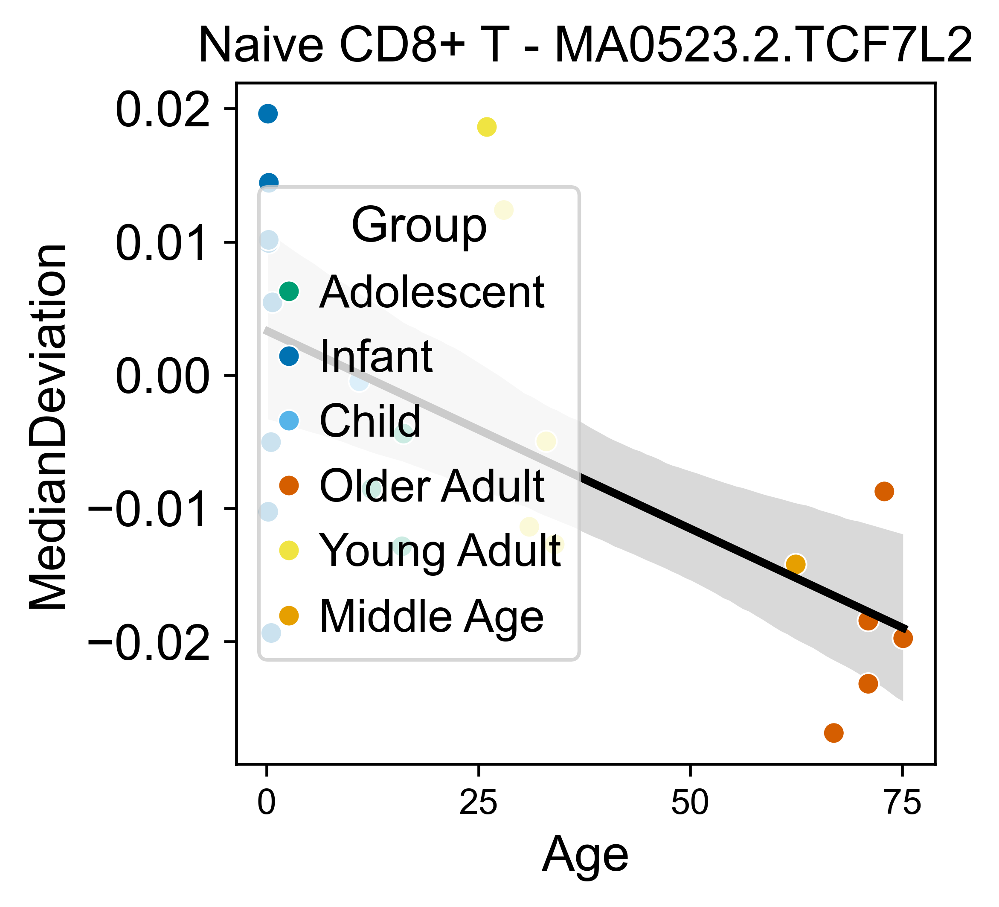

In [180]:
fig , df= plotCorrelation(cd8, 'MA0523.2.TCF7L2', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_TCF7L2Correlations.pdf")

df

Pearson: PearsonRResult(statistic=np.float64(-0.482803278381385), pvalue=np.float64(0.019622234095582967))
Spearman: SignificanceResult(statistic=np.float64(-0.529775158253725), pvalue=np.float64(0.009323957278241566))


,MedianDeviation,Age,Group
Ado_1,-0.028013,12.380000,Adolescent
Ado_2,-0.014236,15.980000,Adolescent
Ado_3,-0.030605,16.160000,Adolescent
Infant_1,0.012860,0.164167,Infant
Infant_2,0.022865,0.197500,Infant
Infant_3,0.031032,0.235833,Infant
Infant_4,0.025361,0.247500,Infant
Infant_5,0.028519,0.269167,Infant
Infant_6,-0.013256,0.525000,Infant
Infant_7,-0.039009,0.550000,Infant


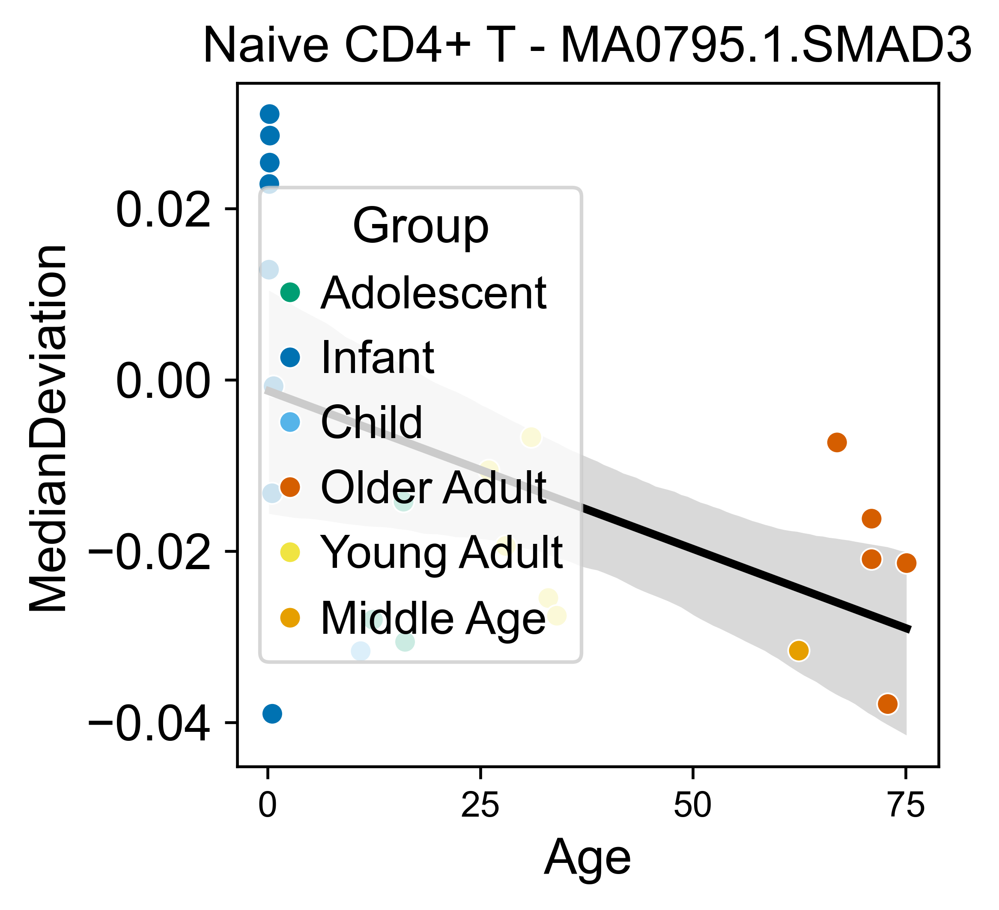

In [181]:
fig, df = plotCorrelation(cd4, 'MA0795.1.SMAD3', 'Naive CD4+ T', ['CD4_naive_SOX4-', "CD4_naive_SOX4+"])

fig.savefig("./figures/NCD4_SMAD3Correlations.pdf")
df

Pearson: PearsonRResult(statistic=np.float64(-0.6041805526534502), pvalue=np.float64(0.002264064531092104))
Spearman: SignificanceResult(statistic=np.float64(-0.5989622125032786), pvalue=np.float64(0.002528342201152364))


,MedianDeviation,Age,Group
Ado_1,-0.015773,12.380000,Adolescent
Ado_2,-0.006941,15.980000,Adolescent
Ado_3,-0.017135,16.160000,Adolescent
Infant_1,0.010832,0.164167,Infant
Infant_2,0.020897,0.197500,Infant
Infant_3,0.024454,0.235833,Infant
Infant_4,0.025718,0.247500,Infant
Infant_5,0.023572,0.269167,Infant
Infant_6,-0.003788,0.525000,Infant
Infant_7,-0.017431,0.550000,Infant


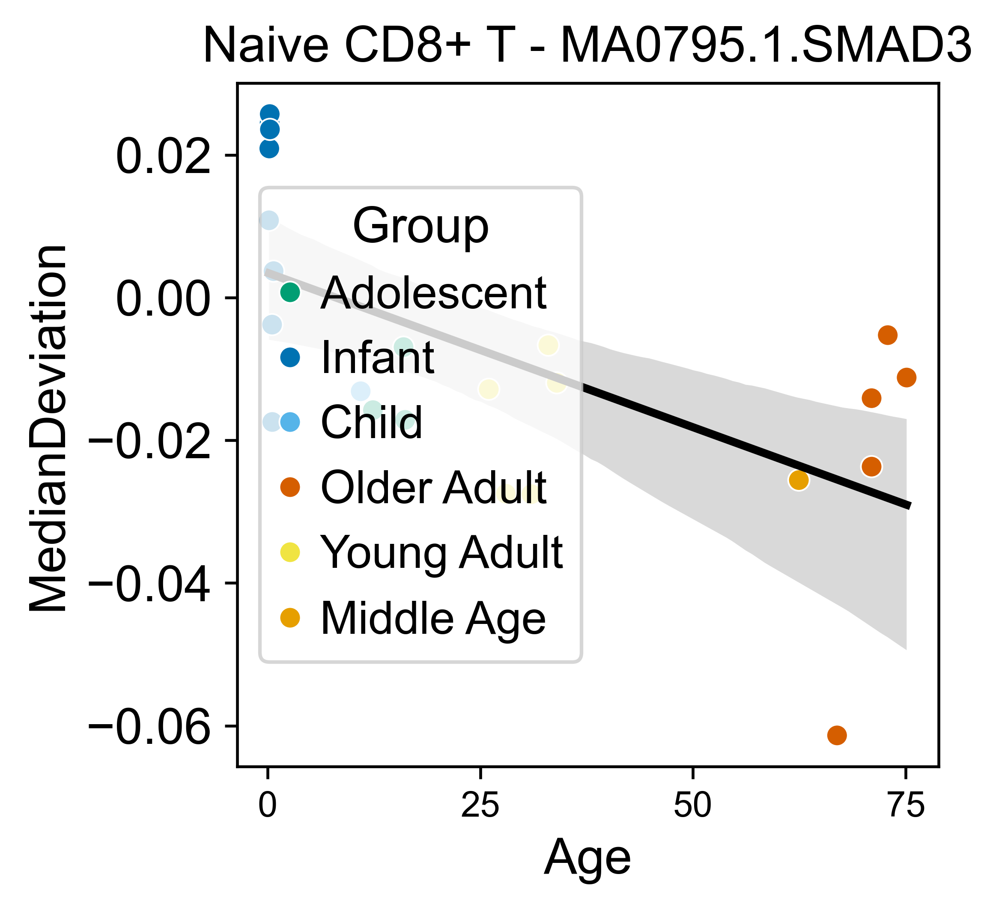

In [182]:
fig, df= plotCorrelation(cd8, 'MA0795.1.SMAD3', 'Naive CD8+ T', ['CD8_naive_SOX4-', "CD8_naive_SOX4+"])

fig.savefig("./figures/NCD8_SMAD3Correlations.pdf")

df

# Figure 8g, CCR4

In [76]:
naivecd4_cpm = pd.read_csv("./NaiveCD4Log2CPM.csv", index_col=0)

In [121]:
ccr4df = pd.DataFrame(columns=['CCR4 TSS','Age'], index=naivecd4_cpm.columns, dtype=float)


In [122]:
ccr4df.loc[naivecd4_cpm.columns,'CCR4 TSS'] = naivecd4_cpm.loc['chr3_32951465_32951964'].values

In [123]:
for curindex in ccr4df.index:
    ccr4df.loc[curindex,'Age'] = cd4.obs.loc[cd4.obs['batch'] == curindex,'Age'].values[0]

Pearson: PearsonRResult(statistic=np.float64(-0.8409748746354162), pvalue=np.float64(5.032133298826359e-07))
Spearman: SignificanceResult(statistic=np.float64(-0.9068446039137923), pvalue=np.float64(2.478157560902996e-09))


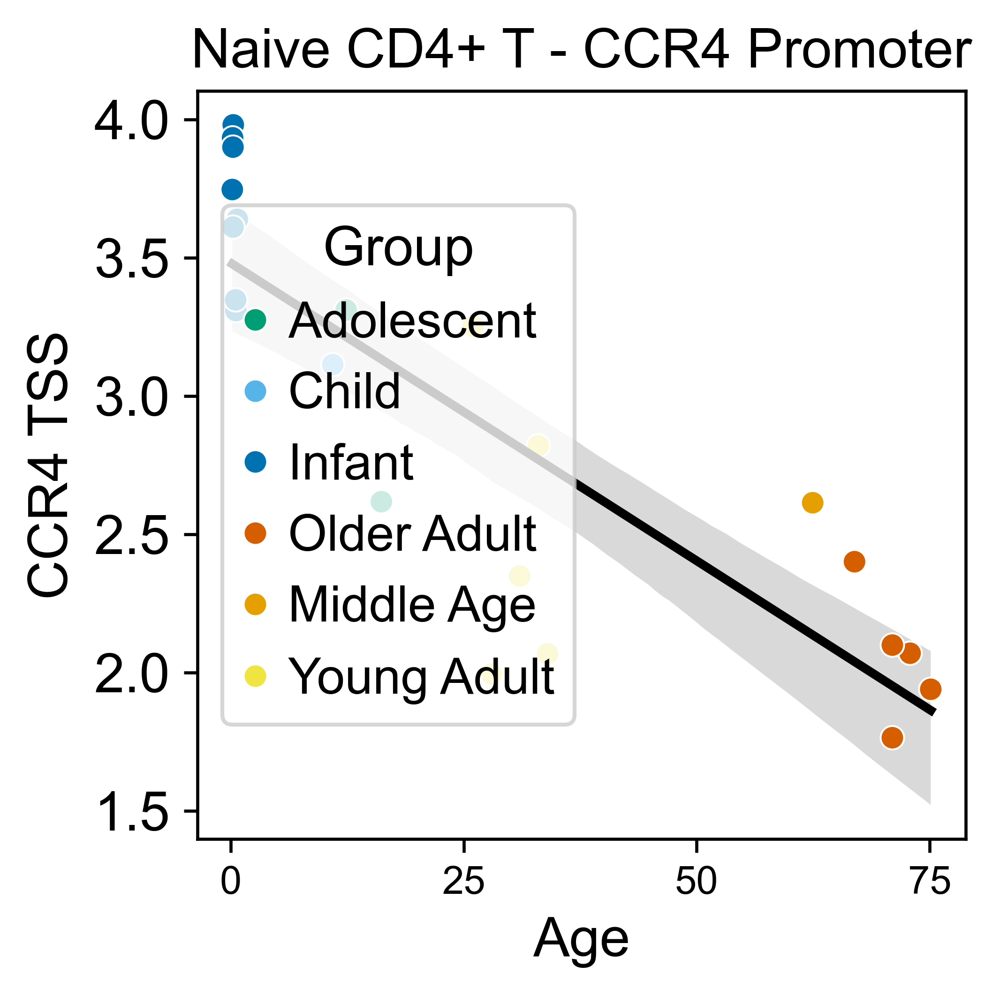

In [124]:
with rc_context({'figure.figsize': (3.5,3.5), 
             'axes.grid': False, 
             'xtick.labelsize': 10, 
             'legend.loc':'center left',
            }):
    curdf = ccr4df.copy()

    curdf['Group'] = None

    curdf.loc[curdf['Age'] < 85, 'Group'] = "Older Adult"
    curdf.loc[curdf['Age'] < 65, 'Group'] = "Middle Age"
    curdf.loc[curdf['Age'] < 40, 'Group'] = "Young Adult"
    curdf.loc[curdf['Age'] < 18, 'Group'] = "Adolescent"
    curdf.loc[curdf['Age'] < 12, 'Group'] = "Child"
    curdf.loc[curdf['Age'] < 2, 'Group'] = "Infant"

    fig = plt.figure()
    plt.grid(False)
    sb.regplot(curdf, x='Age', y='CCR4 TSS', scatter=False, color='#000000')
    sb.scatterplot(curdf, x='Age', y='CCR4 TSS', hue = 'Group', palette=agepalette)
    plt.title("Naive CD4+ T - CCR4 Promoter")

    print("Pearson: "+str(stats.pearsonr(curdf['CCR4 TSS'], curdf['Age'])))
    print("Spearman: "+str(stats.spearmanr(curdf['CCR4 TSS'], curdf['Age'])))

    
    plt.xticks([0,25,50,75],[0,25,50,75],)
    fig.savefig("figures/CCR4TSS_Correlation.pdf")


In [125]:
curdf

,CCR4 TSS,Age,Group
Ado_2,2.617186,15.980000,Adolescent
Infant_9,3.113479,10.940000,Child
Ado_3,2.617913,16.160000,Adolescent
Ado_1,3.310781,12.380000,Adolescent
Infant_7,3.308751,0.550000,Infant
Infant_1,3.746439,0.164167,Infant
Infant_8,3.638660,0.702500,Infant
Infant_6,3.347506,0.525000,Infant
Infant_5,3.980192,0.269167,Infant
Infant_4,3.610753,0.247500,Infant
